In [1]:
from misc.preferences import PREFERENCES
from misc.run_configuration import good_organic_hp_params, default_params, OutputLayerType
from data.organic2019 import ORGANIC_TASK_ALL, ORGANIC_TASK_ENTITIES, ORGANIC_TASK_ATTRIBUTES, ORGANIC_TASK_ENTITIES_COMBINE, ORGANIC_TASK_COARSE
from misc.experimental_environment import Experiment
import time
from data.organic2019 import organic_dataset as dsl
import pprint
from misc import utils

STATUS_FAIL = 'fail'
STATUS_OK = 'ok'

/app/misc/run_configuration.py:409: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(config.model_size % config.n_heads == 0, f'number of heads {config.n_heads} is not a valid number of heads for model size {config.model_size}.')


In [2]:
PREFERENCES.defaults(
    data_root='./data/data/organic2019',
    data_train='train.csv',    
    data_validation='validation.csv',
    data_test='test.csv',
    source_index=0,
    target_vocab_index=1,
    file_format='csv'
)
main_experiment_name = 'Organic19_Experiment'
use_cuda = True

In [3]:
baseline = good_organic_hp_params
print(pprint.pformat(baseline, indent=2))

{ 'att_d_k': 150,
  'att_d_v': 150,
  'batch_size': 64,
  'clip_comments_to': 169,
  'dropout_rate': 0.2827482,
  'early_stopping': 5,
  'embedding_dim': 300,
  'embedding_name': '6B',
  'embedding_type': 'glove',
  'language': 'en',
  'learning_rate_scheduler': { 'noam_learning_rate_factor': 2.528475,
                               'noam_learning_rate_warmup': 5499},
  'learning_rate_scheduler_type': <LearningSchedulerType.Noam: 1>,
  'log_every_xth_iteration': -1,
  'model_size': 300,
  'num_encoder_blocks': 2,
  'num_epochs': 35,
  'num_heads': 2,
  'optimizer': { 'adam_beta1': 0.9206513739,
                 'adam_beta2': 0.9392212929,
                 'adam_eps': 1.317166484e-05,
                 'adam_weight_decay': 0.0001,
                 'learning_rate': 0.0097},
  'optimizer_type': <OptimizerType.Adam: 1>,
  'output_dropout_rate': 0.39743837844,
  'output_layer_type': <OutputLayerType.LinearSum: 1>,
  'pointwise_layer_size': 129,
  'task': 'entities',
  'use_bias': True,
  'us

# Experiments for the first evaluation round

In [4]:
experiments = [
    {
        'name': 'All aspects',
        'description': 'Classification of all entity-attribute combinations',
        'loss': 1000,
        'f1': -1,
        'rc': {'task': ORGANIC_TASK_ALL}
    },
    {
        'name': 'Entities',
        'description': 'Classification of only entities',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_ENTITIES
        }
    },
    {
        'name': 'Attributes',
        'description': 'Classification of only attributes',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_ATTRIBUTES
        }
    },
    {
        'name': 'Entities Combine',
        'description': 'Uses a combination of the last and the current sentence instead of just the sentence alone',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_ENTITIES_COMBINE
        }
    },
    {
        'name': 'Coarse',
        'description': 'Uses the classification of coarse aspects',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_COARSE
        }
    }
]

In [5]:
utils.get_current_git_commit()
print('Current commit: ' + utils.get_current_git_commit())

Current commit: b'cef97b2'


#########################################################################

Experiment Name: All aspects

#########################################################################


Experiment DockerTest initialized
Log path is  /app/logs/DockerTest/20190420/0
Log path is  /app/logs/DockerTest/20190420/1


#########################################################################
Name: DockerTest
Description: Classification of all entity-attribute combinations
#########################################################################


+----------------------------------------------------------------------------------+
|                                 Hyperparameters                                  |
+------------------------------+---------------------------------------------------+
|          Parameter           |                       Value                       |
+------------------------------+---------------------------------------------------+
|            kwargs            | {'b

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+---------------------------------------------------------------------+
|                           Vocabulary Stats                          |
+-------------------------------------------------------------+-------+
|                          Vocabulary                         |  Size |
+-------------------------------------------------------------+-------+
|                      aspect_sentiments                      |   4   |
|                           comments                          | 11600 |
|                           padding                           |   2   |
| GMOs genetic engineering general: Nutr. quality & freshness |   4   |
|    GMOs genetic engineering general: chemicals pesticides   |   4   |
|        GMOs genetic engineering gen





+---------------------------------------------------------------------+
|     GMOs genetic engineering general: Nutr. quality & freshness     |
+-------------+---------+---------------------+-----------------------+
|    Label    | Samples |    Triv. Accuracy   |      Class Weight     |
+-------------+---------+---------------------+-----------------------+
|     n/a     |   9869  |  99.88866396761134  | 0.0011133603238866474 |
|   neutral   |    4    | 0.04048582995951417 |   0.9995951417004049  |
|   positive  |    4    | 0.04048582995951417 |   0.9995951417004049  |
|   negative  |    3    | 0.03036437246963563 |   0.9996963562753036  |
|     Sum     |   9880  |                     |          1.0          |
| Head Weight |         |                     |   0.9988866396761134  |
+-------------+---------+---------------------+-----------------------+



+----------------------------------------------------------------------+
|        GMOs genetic engineering general: chemicals pes

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linea

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/1/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/1/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/1/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/1/20190420/35EP/0
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - START training.
pre_training - INFO - START training.


# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	2.04		0.83		0.031		0.974		0.90m - 0.9m / 0.0m
2	17k	0.85		0.62		0.000		0.996		0.84m - 2.0m / 31.7m
3	25k	0.76		0.59		0.067		0.988		0.88m - 3.1m / 29.8m
4	34k	0.69		0.57		0.069		0.971		0.89m - 4.3m / 31.5m
5	42k	0.60		0.57		0.068		0.961		0.91m - 5.4m / 32.0m
6	51k	0.53		0.59		0.055		0.938		0.93m - 6.6m / 33.0m
7	59k	0.47		0.58		0.054		0.945		0.93m - 7.8m / 33.7m
8	68k	0.42		0.57		0.063		0.951		0.92m - 9.0m / 34.0m
9	76k	0.37		0.58		0.059		0.943		0.93m - 10.1m / 34.0m
Training duration was 623.9382498264313
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.06940298507462686 - (0.06940298507462686)
VAL loss	0.568803912649552
       .---.
 	/     \
	\.@-@./		Experiment: [0/5]
	/`\_/`\		Status: ok
	//  _  \\	Loss: 0.568803912649552
	| \     )|_	f1: 0.06940298507462686
	/`\_`>  <_/ \
	\__/'---'\__/

Log path is  /app/logs/DockerTest/20190420/2


#####################################

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+---------------------------------------------------------------------+
|                           Vocabulary Stats                          |
+-------------------------------------------------------------+-------+
|                          Vocabulary                         |  Size |
+-------------------------------------------------------------+-------+
|                      aspect_sentiments                      |   4   |
|                           comments                          | 11600 |
|                           padding                           |   2   |
| GMOs genetic engineering general: Nutr. quality & freshness |   4   |
|    GMOs genetic engineering general: chemicals pesticides   |   4   |
|        GMOs genetic engineering gen

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
      

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/2/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/2/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/2/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/2/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/2/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/2/20190420/35EP/0
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	2.17		0.93		0.025		0.966		0.83m - 0.8m / 0.0m
2	17k	0.88		0.62		0.044		0.994		0.85m - 1.9m / 29.3m
3	25k	0.76		0.59		0.060		0.991		0.85m - 3.0m / 30.2m
4	34k	0.69		0.58		0.082		0.970		0.88m - 4.1m / 30.5m
5	42k	0.60		0.57		0.071		0.965		0.89m - 5.3m / 31.8m
6	51k	0.53		0.62		0.049		0.935		0.90m - 6.4m / 32.2m
7	59k	0.47		0.59		0.060		0.947		0.90m - 7.6m / 32.8m
8	68k	0.42		0.60		0.059		0.949		0.91m - 8.7m / 32.9m
9	76k	0.37		0.64		0.050		0.932		0.92m - 9.9m / 33.5m
Training duration was 610.4416530132294
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.08154657293497364 - (0.08154657293497364)
VAL loss	0.5738962776958942
       .---.
 	/     \
	\.@-@./		Experiment: [1/5]
	/`\_/`\		Status: ok
	//  _  \\	Loss: 0.5738962776958942
	| \     )|_	f1: 0.08154657293497364
	/`\_`>  <_/ \
	\__/'---'\__/

Log path is  /app/logs/DockerTest/20190

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+---------------------------------------------------------------------+
|                           Vocabulary Stats                          |
+-------------------------------------------------------------+-------+
|                          Vocabulary                         |  Size |
+-------------------------------------------------------------+-------+
|                      aspect_sentiments                      |   4   |
|                           comments                          | 11600 |
|                           padding                           |   2   |
| GMOs genetic engineering general: Nutr. quality & freshness |   4   |
|    GMOs genetic engineering general: chemicals pesticides   |   4   |
|        GMOs genetic engineering gen

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/3/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/3/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/3/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/3/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/3/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/3/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/3/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/3/20190420/35EP/0
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch s

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	2.13		0.88		0.002		0.978		0.83m - 0.8m / 0.0m
2	17k	0.87		0.63		0.035		0.990		0.84m - 1.9m / 29.3m
3	25k	0.76		0.60		0.063		0.988		0.87m - 3.0m / 29.9m
4	34k	0.69		0.58		0.068		0.966		0.87m - 4.2m / 31.0m
5	42k	0.59		0.58		0.060		0.955		0.86m - 5.3m / 31.5m
6	51k	0.52		0.60		0.046		0.933		0.88m - 6.4m / 31.5m
7	59k	0.46		0.58		0.063		0.950		0.90m - 7.6m / 32.3m
8	68k	0.41		0.59		0.061		0.954		0.91m - 8.7m / 33.0m
9	76k	0.37		0.61		0.053		0.943		0.92m - 9.9m / 33.5m
Training duration was 609.920158624649
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.0679886685552408 - (0.0679886685552408)
VAL loss	0.5768760902186235
       .---.
 	/     \
	\.@-@./		Experiment: [2/5]
	/`\_/`\		Status: ok
	//  _  \\	Loss: 0.5768760902186235
	| \     )|_	f1: 0.0679886685552408
	/`\_`>  <_/ \
	\__/'---'\__/


+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+---------------------------------------------------------------------+
|                           Vocabulary Stats                          |
+-------------------------------------------------------------+-------+
|                          Vocabulary                         |  Size |
+-------------------------------------------------------------+-------+
|                      aspect_sentiments                      |   4   |
|                           comments                          | 11600 |
|                           padding                           |   2   |
| GMOs genetic engineering general: Nutr. quality & freshness |   4   |
|    GMOs genetic engineering general: chemicals pesticides   |   4   |
|        GMOs genetic engineering gen

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Drop

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/4/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/4/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/4/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/4/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/4/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/4/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/4/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/4/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/4/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/4/20190420/35EP/0
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	2.05		0.89		0.017		0.966		0.84m - 0.8m / 0.0m
2	17k	0.87		0.63		0.000		0.995		0.85m - 1.9m / 29.5m
3	25k	0.75		0.58		0.065		0.987		0.87m - 3.0m / 30.4m
4	34k	0.68		0.56		0.076		0.970		0.85m - 4.1m / 31.0m
5	42k	0.59		0.56		0.061		0.956		0.87m - 5.3m / 30.8m
6	51k	0.52		0.58		0.054		0.939		0.89m - 6.4m / 31.6m
7	59k	0.46		0.58		0.055		0.944		0.90m - 7.6m / 32.5m
8	68k	0.41		0.56		0.066		0.955		0.91m - 8.7m / 32.9m
9	76k	0.37		0.61		0.052		0.938		0.92m - 9.9m / 33.5m
Training duration was 606.9213361740112
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.07579549517340008 - (0.07579549517340008)
VAL loss	0.5571811844905218
       .---.
 	/     \
	\.@-@./		Experiment: [3/5]
	/`\_/`\		Status: ok
	//  _  \\	Loss: 0.5571811844905218
	| \     )|_	f1: 0.

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+---------------------------------------------------------------------+
|                           Vocabulary Stats                          |
+-------------------------------------------------------------+-------+
|                          Vocabulary                         |  Size |
+-------------------------------------------------------------+-------+
|                      aspect_sentiments                      |   4   |
|                           comments                          | 11600 |
|                           padding                           |   2   |
| GMOs genetic engineering general: Nutr. quality & freshness |   4   |
|    GMOs genetic engineering general: chemicals pesticides   |   4   |
|        GMOs genetic engineering gen

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (att

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/5/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/5/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/5/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/5/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/5/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/5/20190420/35/0/. Full path is /app/runs/DockerTest/2

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	2.04		0.88		0.018		0.949		0.81m - 0.8m / 0.0m
2	17k	0.86		0.62		0.028		0.993		0.85m - 1.9m / 28.6m
3	25k	0.76		0.58		0.065		0.987		0.85m - 3.0m / 30.2m
4	34k	0.68		0.55		0.071		0.962		0.85m - 4.1m / 30.5m
5	42k	0.59		0.55		0.062		0.958		0.87m - 5.2m / 30.8m
6	51k	0.52		0.56		0.060		0.944		0.88m - 6.4m / 31.6m
7	59k	0.46		0.56		0.059		0.947		0.90m - 7.5m / 32.1m
8	68k	0.41		0.56		0.061		0.949		0.90m - 8.7m / 33.0m
9	76k	0.36		0.59		0.058		0.942		0.92m - 9.8m / 33.3m
Training duration was 606.1678519248962
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.07060152499293985 - (0.07060152499293985)
VAL loss	0.5496580439309279
       .---.
 	/     \
	\.@-@./		Experiment: [4/5]
	/`\_/`\		Status: ok
	//  _  \\	

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11600 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linea

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/7/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/7/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/7/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/7/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/7/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/7/20190420/35/0/. Full path is /app/runs/DockerTest/2

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.16		0.11		0.019		0.941		0.35m - 0.3m / 0.0m
2	17k	0.14		0.11		0.094		0.906		0.35m - 0.7m / 12.2m
3	25k	0.13		0.10		0.164		0.884		0.36m - 1.1m / 12.4m
4	34k	0.12		0.11		0.145		0.841		0.36m - 1.5m / 12.6m
5	42k	0.11		0.12		0.128		0.781		0.36m - 1.9m / 12.6m
6	51k	0.11		0.12		0.143		0.771		0.36m - 2.3m / 12.8m
7	59k	0.10		0.12		0.156		0.793		0.36m - 2.7m / 12.7m
8	68k	0.10		0.13		0.135		0.777		0.36m - 3.1m / 12.8m
Training duration was 188.65019869804382
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.1642512077294686 - (0.1642512077294686)
VAL loss	0.10430294554680586
       .---.
 	/     \
	\.@-@./		Experiment: [0/

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11600 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_feat

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.17		0.12		0.051		0.934		0.35m - 0.4m / 0.0m
2	17k	0.14		0.11		0.127		0.882		0.36m - 0.7m / 12.4m
3	25k	0.13		0.10		0.162		0.871		0.36m - 1.1m / 12.6m
4	34k	0.12		0.10		0.166		0.837		0.36m - 1.5m / 12.6m
5	42k	0.11		0.11		0.149		0.797		0.35m - 1.9m / 12.6m
6	51k	0.11		0.12		0.134		0.759		0.36m - 2.3m / 12.6m
7	59k	0.10		0.11		0.157		0.801		0.36m - 2.7m / 12.7m
8	68k	0.09		0.12		0.144		0.767		0.36m - 3.1m / 12.7m
9	76k	0.09		0.11		0.168		0.813		0.36m - 3.5m / 12.8m
10	84k	0.08		0.11		0.179		0.840		0.36m - 3.9m / 12.9m
11	93k	0.08		0.13		0.165		0.811		0.36m - 4.3m / 12.9m
12	101k	0.07		0.12		0.178		0.835		0.36m - 4.7m / 12.9m
13	110k	0.07		0.12		0.187		0.841		0.36m - 5.1m / 12.9m
14	118k	0.06		0.13		0.202		0.851		0.36m - 5.5m / 13.0m
15	127k	0.06		0.13		0.196		0.842		0.36m - 5.9m / 13.0m
16	135k	0.06		0.13		0.187		0.815		0.36m - 6.3m / 13.0m
17	144k	0.06		0.13		0.169		0.823		0.36m - 6.6m / 13.1m
18	152k	0.05		0.14		0.182		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11600 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): Mu

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/9/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/9/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/9/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/9/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/9/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/9/20190420/35/0/. Full path is /app/runs/DockerTest/2

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.17		0.12		0.034		0.940		0.35m - 0.4m / 0.0m
2	17k	0.14		0.11		0.122		0.891		0.35m - 0.7m / 12.3m
3	25k	0.13		0.10		0.176		0.883		0.36m - 1.1m / 12.4m
4	34k	0.12		0.10		0.155		0.853		0.36m - 1.5m / 12.5m
5	42k	0.11		0.11		0.159		0.821		0.35m - 1.9m / 12.6m
6	51k	0.10		0.12		0.152		0.784		0.36m - 2.3m / 12.5m
7	59k	0.10		0.11		0.171		0.813		0.36m - 2.7m / 12.7m
8	68k	0.09		0.12		0.154		0.802		0.35m - 3.1m / 12.7m
Training duration was 186.94563460350037
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
VAL f1	0.17570093457943925 - (0.175700

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11600 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/10/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/10/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/10/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/10/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/10/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/10/20190420/35/0/. Full path is /app/runs/D

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.17		0.11		0.005		0.945		0.35m - 0.4m / 0.0m
2	17k	0.14		0.10		0.119		0.900		0.35m - 0.7m / 12.3m
3	25k	0.13		0.10		0.162		0.870		0.35m - 1.1m / 12.5m
4	34k	0.12		0.10		0.145		0.848		0.35m - 1.5m / 12.5m
5	42k	0.11		0.11		0.141		0.788		0.36m - 1.9m / 12.4m
6	51k	0.11		0.12		0.143		0.750		0.35m - 2.3m / 12.8m
7	59k	0.10		0.11		0.174		0.830		0.35m - 2.7m / 12.6m
8	68k	0.09		0.13		0.135		0.773		0.35m - 3.1m / 12.6m
9	76k	0.09		0.12		0.151		0.791		0.35m - 3.5m / 12.7m
10	84k	0.09		0.11		0.178		0.828		0.36m - 3.9m / 12.7m
11	93k	0.08		0.13		0.152		0.774		0.35m - 4.2m / 12.8m
12	101k	0.07		0.13		0.163		0.806		0.35m - 4.6m / 12.7m
13	110k	0.07		0.12		0.178		0.828		0.35m - 5.0m / 12.8m
14	118k	0.07		0.13		0.179		0.830		0.35m - 5.4m / 12.9m
15	127k	0.06		0.14		0.176		0.819		0.35m - 5.8m / 12.9m
16	135k	0.06		0.16		0.164		0.809		0.35m - 6.2m / 12.9m
17	144k	0.06		0.14		0.182		0.828		0.35m - 6.6m / 12.9m
18	152k	0.05		0.14		0.170		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11600 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): Positional

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.


# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.18		0.12		0.000		0.941		0.35m - 0.4m / 0.0m
2	17k	0.15		0.11		0.053		0.937		0.35m - 0.7m / 12.3m
3	25k	0.14		0.10		0.153		0.873		0.36m - 1.1m / 12.4m
4	34k	0.12		0.10		0.162		0.850		0.35m - 1.5m / 12.6m
5	42k	0.11		0.11		0.146		0.807		0.35m - 1.9m / 12.5m
6	51k	0.11		0.12		0.126		0.756		0.35m - 2.3m / 12.5m
7	59k	0.10		0.11		0.168		0.828		0.35m - 2.7m / 12.6m
8	68k	0.10		0.12		0.153		0.786		0.36m - 3.1m / 12.5m
9	76k	0.09		0.12		0.153		0.795		0.36m - 3.5m / 12.8m
10	84k	0.08		0.12		0.171		0.831		0.35m - 3.8m / 12.8m
11	93k	0.08		0.14		0.130		0.758		0.35m - 4.2m / 12.7m
12	101k	0.08		0.12		0.162		0.833		0.36m - 4.6m / 12.8m
13	110k	0.07		0.13		0.188		0.853		0.36m - 5.0m / 12.9m
14	118k	0.07		0.14		0.190		0.844		0.35m - 5.4m / 12.9m
15	127k	0.06		0.14		0.186		0.836		0.35m - 5.8m / 12.9m
16	135k	0.06		0.15		0.166		0.827		0.35m - 6.2m / 12.9m
17	144k	0.06		0.14		0.201		0.857		0.36m - 6.6m / 12.9m
18	152k	0.06		0.14		0.185		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+-----------------------------------+
|          Vocabulary Stats         |
+---------------------------+-------+
|         Vocabulary        |  Size |
+---------------------------+-------+
|     aspect_sentiments     |   4   |
|          comments         | 11600 |
|          padding          |   2   |
| Nutr. quality & freshness |   4   |
|       animal welfare      |   4   |
|        availability       |   4   |
|    chemicals pesticides   |   4   |
|        environment        |   4   |
|          general          |   4   |
|        healthiness        |   4   |
|           label           |   4   |
|           local           |   4   |
|       origin source       |   4   |
|           price           |   4   |
|        productivity       |   4  

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/13/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/13/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/13/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/13/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/13/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/13/20190420/35/0/. Full path is /app/runs/D

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.28		0.20		0.075		0.944		0.37m - 0.4m / 0.0m
2	17k	0.23		0.19		0.123		0.876		0.37m - 0.8m / 13.0m
3	25k	0.20		0.17		0.142		0.847		0.37m - 1.2m / 13.1m
4	34k	0.19		0.17		0.157		0.865		0.38m - 1.6m / 13.2m
5	42k	0.17		0.18		0.150		0.832		0.37m - 2.0m / 13.4m
6	51k	0.16		0.18		0.148		0.821		0.37m - 2.4m / 13.3m
7	59k	0.15		0.19		0.144		0.811		0.37m - 2.9m / 13.3m
8	68k	0.14		0.19		0.153		0.826		0.37m - 3.3m / 13.2m
9	76k	0.13		0.21		0.136		0.786		0.37m - 3.7m / 13.3m
Training duration was 223.29983568191528
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Va

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+-----------------------------------+
|          Vocabulary Stats         |
+---------------------------+-------+
|         Vocabulary        |  Size |
+---------------------------+-------+
|     aspect_sentiments     |   4   |
|          comments         | 11600 |
|          padding          |   2   |
| Nutr. quality & freshness |   4   |
|       animal welfare      |   4   |
|        availability       |   4   |
|    chemicals pesticides   |   4   |
|        environment        |   4   |
|          general          |   4   |
|        healthiness        |   4   |
|           label           |   4   |
|           local           |   4   |
|       origin source       |   4   |
|           price           |   4   |
|        productivity       |   4  

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iteratio

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.29		0.20		0.005		0.961		0.37m - 0.4m / 0.0m
2	17k	0.23		0.18		0.113		0.898		0.37m - 0.8m / 13.0m
3	25k	0.20		0.17		0.143		0.856		0.37m - 1.2m / 13.0m
4	34k	0.19		0.17		0.126		0.850		0.37m - 1.6m / 13.2m
5	42k	0.17		0.18		0.126		0.829		0.37m - 2.0m / 13.1m
6	51k	0.16		0.19		0.133		0.808		0.37m - 2.4m / 13.1m
7	59k	0.15		0.19		0.145		0.822		0.37m - 2.8m / 13.1m
8	68k	0.14		0.19		0.145		0.840		0.37m - 3.3m / 13.3m
9	76k	0.13		0.20		0.139		0.802		0.37m - 3.7m / 13.3m
10	84k	0.12		0.21		0.137		0.806		0.37m - 4.1m / 13.3m
11	93k	0.11		0.21		0.145		0.824		0.37m - 4.5m / 13.4m
12	101k	0.11		0.20		0.183		0.869		0.37m - 4.9m / 13.4m
13	110k	0.10		0.21		0.163		0.842		0.37m - 5.3m / 13.5m
14	118k	0.09		0.20		0.175		0.862		0.37m - 5.7m / 13.5m
15	127k	0.09		0.24		0.172		0.863		0.37m - 6.1m / 13.6m
16	135k	0.08		0.23		0.166		0.859		0.38m - 6.6m / 13.6m
17	144k	0.08		0.23		0.151		0.845		0.37m - 7.0m / 13.8m
Training duration was 420.51

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+-----------------------------------+
|          Vocabulary Stats         |
+---------------------------+-------+
|         Vocabulary        |  Size |
+---------------------------+-------+
|     aspect_sentiments     |   4   |
|          comments         | 11600 |
|          padding          |   2   |
| Nutr. quality & freshness |   4   |
|       animal welfare      |   4   |
|        availability       |   4   |
|    chemicals pesticides   |   4   |
|        environment        |   4   |
|          general          |   4   |
|        healthiness        |   4   |
|           label           |   4   |
|           local           |   4   |
|       origin source       |   4   |
|           price           |   4   |
|        productivity       |   4  

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/15/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/15/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/15/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/15/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/15/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/15/20190420/35/0/. Full path is /app/runs/D

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.29		0.21		0.005		0.964		0.37m - 0.4m / 0.0m
2	17k	0.24		0.19		0.114		0.922		0.37m - 0.8m / 12.8m
3	25k	0.21		0.17		0.141		0.842		0.37m - 1.2m / 13.1m
4	34k	0.19		0.17		0.151		0.846		0.37m - 1.6m / 13.1m
5	42k	0.17		0.17		0.152		0.839		0.38m - 2.0m / 13.2m
6	51k	0.16		0.19		0.130		0.793		0.39m - 2.5m / 13.3m
7	59k	0.15		0.19		0.140		0.813		0.37m - 2.9m / 13.7m
8	68k	0.14		0.20		0.136		0.822		0.37m - 3.3m / 13.4m
9	76k	0.13		0.21		0.126		0.767		0.38m - 3.7m / 13.3m
10	84k	0.12		0.21		0.124		0.766		0.38m - 4.1m / 13.6m
Training duration was 250.99491500854492
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBU

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+-----------------------------------+
|          Vocabulary Stats         |
+---------------------------+-------+
|         Vocabulary        |  Size |
+---------------------------+-------+
|     aspect_sentiments     |   4   |
|          comments         | 11600 |
|          padding          |   2   |
| Nutr. quality & freshness |   4   |
|       animal welfare      |   4   |
|        availability       |   4   |
|    chemicals pesticides   |   4   |
|        environment        |   4   |
|          general          |   4   |
|        healthiness        |   4   |
|           label           |   4   |
|           local           |   4   |
|       origin source       |   4   |
|           price           |   4   |
|        productivity       |   4  

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.28		0.20		0.000		0.963		0.36m - 0.4m / 0.0m
2	17k	0.23		0.18		0.111		0.893		0.37m - 0.8m / 12.8m
3	25k	0.21		0.17		0.147		0.850		0.37m - 1.2m / 13.1m
4	34k	0.19		0.16		0.147		0.861		0.37m - 1.6m / 13.2m
5	42k	0.17		0.18		0.141		0.816		0.38m - 2.0m / 13.1m
6	51k	0.16		0.18		0.151		0.808		0.37m - 2.4m / 13.3m
7	59k	0.15		0.17		0.162		0.849		0.37m - 2.9m / 13.3m
8	68k	0.14		0.18		0.172		0.862		0.38m - 3.3m / 13.4m
9	76k	0.13		0.19		0.151		0.821		0.37m - 3.7m / 13.5m
10	84k	0.12		0.18		0.163		0.844		0.38m - 4.1m / 13.3m
11	93k	0.12		0.21		0.154		0.858		0.38m - 4.5m / 13.6m
12	101k	0.11		0.19		0.210		0.881		0.38m - 5.0m / 13.7m
13	110k	0.10		0.21		0.159		0.855		0.38m - 5.4m / 13.7m
14	118k	0.09		0.21		0.178		0.882		0.37m - 5.8m / 13.8m
15	127k	0.09		0.24		0.185		0.888		0.37m - 6.2m / 13.7m
16	135k	0.08		0.24		0.149		0.863		0.38m - 6.7m / 13.8m
17	144k	0.08		0.25		0.160		0.867		0.38m - 7.1m / 13.9m
Training duration was 428.00

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+-----------------------------------+
|          Vocabulary Stats         |
+---------------------------+-------+
|         Vocabulary        |  Size |
+---------------------------+-------+
|     aspect_sentiments     |   4   |
|          comments         | 11600 |
|          padding          |   2   |
| Nutr. quality & freshness |   4   |
|       animal welfare      |   4   |
|        availability       |   4   |
|    chemicals pesticides   |   4   |
|        environment        |   4   |
|          general          |   4   |
|        healthiness        |   4   |
|           label           |   4   |
|           local           |   4   |
|       origin source       |   4   |
|           price           |   4   |
|        productivity       |   4  

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/17/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/17/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/17/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/17/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/17/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/17/20190420/35/0/. Full path is /app/runs/D

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.29		0.20		0.031		0.935		0.37m - 0.4m / 0.0m
2	17k	0.23		0.18		0.112		0.877		0.37m - 0.8m / 12.9m
3	25k	0.20		0.17		0.133		0.816		0.37m - 1.2m / 13.1m
4	34k	0.19		0.17		0.124		0.842		0.37m - 1.6m / 13.1m
5	42k	0.17		0.18		0.116		0.790		0.38m - 2.0m / 13.2m
6	51k	0.16		0.18		0.133		0.790		0.37m - 2.4m / 13.5m
7	59k	0.15		0.17		0.138		0.819		0.37m - 2.8m / 13.1m
8	68k	0.14		0.18		0.157		0.836		0.37m - 3.2m / 13.2m
9	76k	0.13		0.20		0.131		0.791		0.37m - 3.6m / 13.2m
10	84k	0.12		0.21		0.126		0.769		0.37m - 4.1m / 13.3m
11	93k	0.11		0.20		0.152		0.833		0.37m - 4.5m / 13.3m
12	101k	0.11		0.20		0.157		0.839		0.37m - 4.9m / 13.4m
13	110k	0.10		0.21		0.165		0.854		0.38m - 5.3m / 13.4m
14	118k	0.09		0.20		0.160		0.860		0.37m - 5.7m / 13.6m
15	127k	0.09		0.23		0.161		0.841		0.38m - 6.1m / 13.6m
16	135k	0.08		0.22		0.178		0.859		0.38m - 6.6m / 13.7m
17	144k	0.08		0.24		0.159		0.860		0.37m - 7.0m / 13.8m
18	152k	0.07		0.22		0.144		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11596 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/19/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/19/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/19/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/19/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/19/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/19/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.


# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.16		0.12		0.009		0.934		0.35m - 0.3m / 0.0m
2	17k	0.14		0.11		0.132		0.865		0.35m - 0.7m / 12.2m
3	25k	0.13		0.11		0.155		0.875		0.35m - 1.1m / 12.4m
4	34k	0.12		0.11		0.136		0.840		0.35m - 1.5m / 12.5m
5	42k	0.11		0.12		0.113		0.786		0.35m - 1.9m / 12.4m
6	51k	0.11		0.12		0.135		0.757		0.35m - 2.3m / 12.5m
7	59k	0.10		0.12		0.131		0.792		0.35m - 2.7m / 12.5m
8	68k	0.09		0.13		0.138		0.771		0.35m - 3.1m / 12.6m
Training duration was 185.5888934135437
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11596 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.17		0.12		0.000		0.946		0.36m - 0.4m / 0.0m
2	17k	0.14		0.11		0.119		0.900		0.36m - 0.7m / 12.5m
3	25k	0.13		0.11		0.138		0.878		0.35m - 1.1m / 12.6m
4	34k	0.12		0.11		0.124		0.845		0.35m - 1.5m / 12.5m
5	42k	0.11		0.12		0.124		0.793		0.35m - 1.9m / 12.5m
6	51k	0.11		0.12		0.142		0.774		0.35m - 2.3m / 12.6m
7	59k	0.10		0.12		0.142		0.813		0.36m - 2.7m / 12.6m
8	68k	0.09		0.14		0.118		0.780		0.35m - 3.1m / 12.7m
9	76k	0.09		0.13		0.154		0.805		0.35m - 3.5m / 12.7m
10	84k	0.08		0.13		0.155		0.803		0.35m - 3.9m / 12.6m
11	93k	0.08		0.13		0.151		0.820		0.35m - 4.3m / 12.7m
12	101k	0.07		0.14		0.158		0.810		0.35m - 4.7m / 12.8m
13	110k	0.07		0.13		0.174		0.854		0.35m - 5.0m / 12.8m
14	118k	0.06		0.15		0.171		0.819		0.35m - 5.4m / 12.8m
15	127k	0.06		0.15		0.159		0.824		0.35m - 5.8m / 12.8m
16	135k	0.06		0.16		0.155		0.824		0.35m - 6.2m / 12.9m
17	144k	0.06		0.17		0.146		0.814		0.35m - 6.6m / 13.0m
18	152k	0.06		0.15		0.162		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11596 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/21/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/21/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/21/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/21/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/21/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/21/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.


# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.18		0.12		0.029		0.941		0.35m - 0.4m / 0.0m
2	17k	0.14		0.11		0.080		0.888		0.35m - 0.8m / 12.3m
3	25k	0.13		0.11		0.126		0.879		0.35m - 1.1m / 12.5m
4	34k	0.12		0.11		0.127		0.852		0.35m - 1.5m / 12.4m
5	42k	0.11		0.11		0.122		0.827		0.36m - 1.9m / 12.5m
6	51k	0.11		0.12		0.134		0.777		0.35m - 2.3m / 12.7m
7	59k	0.10		0.13		0.114		0.753		0.35m - 2.7m / 12.5m
8	68k	0.09		0.14		0.125		0.783		0.35m - 3.1m / 12.7m
9	76k	0.09		0.13		0.148		0.784		0.36m - 3.5m / 12.7m
10	84k	0.08		0.12		0.172		0.826		0.35m - 3.9m / 12.8m
11	93k	0.08		0.13		0.174		0.825		0.35m - 4.3m / 12.7m
12	101k	0.07		0.13		0.161		0.820		0.35m - 4.6m / 12.7m
13	110k	0.07		0.14		0.162		0.835		0.35m - 5.0m / 12.8m
14	118k	0.07		0.15		0.151		0.812		0.35m - 5.4m / 12.7m
15	127k	0.06		0.16		0.165		0.828		0.35m - 5.8m / 12.9m
16	135k	0.06		0.15		0.185		0.844		0.36m - 6.2m / 12.9m
17	144k	0.05		0.16		0.178		0.851		0.36m - 6.6m / 13.0m
18	152k	0.05		0.16		0.167		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11596 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/22/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/22/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/22/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/22/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/22/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/22/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START trai

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.18		0.12		0.000		0.946		0.35m - 0.3m / 0.0m
2	17k	0.14		0.11		0.068		0.892		0.35m - 0.7m / 12.2m
3	25k	0.13		0.10		0.157		0.868		0.36m - 1.1m / 12.4m
4	34k	0.12		0.10		0.173		0.853		0.35m - 1.5m / 12.7m
5	42k	0.11		0.11		0.138		0.799		0.35m - 1.9m / 12.4m
6	51k	0.11		0.12		0.143		0.768		0.35m - 2.3m / 12.6m
7	59k	0.10		0.12		0.143		0.787		0.35m - 2.7m / 12.6m
8	68k	0.10		0.13		0.138		0.800		0.35m - 3.1m / 12.4m
9	76k	0.09		0.12		0.154		0.809		0.36m - 3.5m / 12.6m
Training duration was 209.86010313034058
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Va

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+------------------------------------------+
|             Vocabulary Stats             |
+----------------------------------+-------+
|            Vocabulary            |  Size |
+----------------------------------+-------+
|        aspect_sentiments         |   4   |
|             comments             | 11596 |
|             padding              |   2   |
| GMOs genetic engineering general |   4   |
|      conventional companies      |   3   |
|       conventional farming       |   4   |
|       conventional general       |   4   |
|      conventional products       |   4   |
|        organic companies         |   4   |
|         organic farmers          |   4   |
|         organic general          |   4   |
|         organic products         | 

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout


pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropou

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training - DEBUG - train with cuda support
pre_training 

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.18		0.12		0.000		0.948		0.35m - 0.3m / 0.0m
2	17k	0.15		0.11		0.080		0.929		0.36m - 0.7m / 12.2m
3	25k	0.13		0.11		0.131		0.873		0.35m - 1.1m / 12.5m
4	34k	0.12		0.11		0.129		0.824		0.35m - 1.5m / 12.5m
5	42k	0.11		0.12		0.135		0.801		0.35m - 1.9m / 12.5m
6	51k	0.11		0.12		0.135		0.760		0.35m - 2.3m / 12.5m
7	59k	0.10		0.12		0.137		0.789		0.35m - 2.7m / 12.6m
8	68k	0.09		0.13		0.129		0.784		0.35m - 3.1m / 12.6m
9	76k	0.09		0.12		0.150		0.801		0.36m - 3.5m / 12.6m
10	84k	0.08		0.13		0.171		0.827		0.35m - 3.9m / 12.8m
11	93k	0.08		0.14		0.167		0.830		0.36m - 4.2m / 12.7m
12	101k	0.07		0.13		0.173		0.829		0.35m - 4.6m / 12.8m
13	110k	0.07		0.14		0.185		0.851		0.35m - 5.0m / 12.8m
14	118k	0.07		0.15		0.179		0.837		0.36m - 5.4m / 12.9m
15	127k	0.06		0.15		0.158		0.824		0.35m - 5.8m / 12.9m
16	135k	0.06		0.15		0.173		0.833		0.36m - 6.2m / 12.9m
17	144k	0.06		0.15		0.152		0.811		0.36m - 6.6m / 13.1m
18	152k	0.05		0.15		0.155		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+----------------------------------------------+
|               Vocabulary Stats               |
+--------------------------------------+-------+
|              Vocabulary              |  Size |
+--------------------------------------+-------+
|          aspect_sentiments           |   4   |
|               comments               | 11596 |
|               padding                |   2   |
|           GMO: environment           |   4   |
|       GMO: experienced quality       |   4   |
|             GMO: general             |   4   |
|              GMO: price              |   4   |
|     GMO: safety and healthiness      |   4   |
|       GMO: trustworthy sources       |   4   |
|      conventional: environment       |   4   |
|  conventional: exper

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/25/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/25/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/25/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/25/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/25/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/25/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_traini

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.31		0.19		0.071		0.926		0.38m - 0.4m / 0.0m
2	17k	0.23		0.17		0.134		0.921		0.38m - 0.8m / 13.5m
3	25k	0.21		0.16		0.139		0.908		0.39m - 1.3m / 13.6m
4	34k	0.19		0.19		0.109		0.843		0.38m - 1.7m / 13.7m
5	42k	0.17		0.18		0.115		0.842		0.39m - 2.1m / 13.6m
6	51k	0.16		0.18		0.131		0.850		0.39m - 2.6m / 13.8m
7	59k	0.15		0.19		0.121		0.851		0.41m - 3.0m / 13.8m
8	68k	0.14		0.18		0.122		0.864		0.40m - 3.5m / 14.6m
Training duration was 211.57427597045898
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Score

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+----------------------------------------------+
|               Vocabulary Stats               |
+--------------------------------------+-------+
|              Vocabulary              |  Size |
+--------------------------------------+-------+
|          aspect_sentiments           |   4   |
|               comments               | 11596 |
|               padding                |   2   |
|           GMO: environment           |   4   |
|       GMO: experienced quality       |   4   |
|             GMO: general             |   4   |
|              GMO: price              |   4   |
|     GMO: safety and healthiness      |   4   |
|       GMO: trustworthy sources       |   4   |
|      conventional: environment       |   4   |
|  conventional: exper

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/26/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/26/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/26/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/26/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/26/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/26/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.


# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.33		0.19		0.010		0.955		0.39m - 0.4m / 0.0m
2	17k	0.24		0.18		0.093		0.935		0.38m - 0.8m / 13.5m
3	25k	0.22		0.16		0.122		0.928		0.39m - 1.2m / 13.5m
4	34k	0.19		0.19		0.114		0.862		0.39m - 1.7m / 13.7m
5	42k	0.17		0.18		0.104		0.844		0.39m - 2.1m / 13.8m
6	51k	0.16		0.17		0.147		0.882		0.39m - 2.6m / 13.8m
7	59k	0.15		0.19		0.118		0.850		0.39m - 3.0m / 13.8m
8	68k	0.14		0.19		0.116		0.862		0.39m - 3.4m / 13.8m
9	76k	0.13		0.21		0.125		0.841		0.39m - 3.9m / 13.9m
10	84k	0.12		0.20		0.144		0.872		0.39m - 4.3m / 14.1m
11	93k	0.11		0.21		0.170		0.888		0.39m - 4.7m / 14.1m
12	101k	0.11		0.21		0.181		0.907		0.39m - 5.2m / 14.2m
13	110k	0.10		0.22		0.176		0.902		0.39m - 5.6m / 14.1m
14	118k	0.10		0.22		0.134		0.880		0.39m - 6.0m / 14.3m
15	127k	0.09		0.22		0.184		0.909		0.39m - 6.5m / 14.3m
16	135k	0.08		0.24		0.176		0.899		0.39m - 6.9m / 14.3m
17	144k	0.08		0.23		0.176		0.896		0.39m - 7.4m / 14.4m
18	152k	0.07		0.24		0.156		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+----------------------------------------------+
|               Vocabulary Stats               |
+--------------------------------------+-------+
|              Vocabulary              |  Size |
+--------------------------------------+-------+
|          aspect_sentiments           |   4   |
|               comments               | 11596 |
|               padding                |   2   |
|           GMO: environment           |   4   |
|       GMO: experienced quality       |   4   |
|             GMO: general             |   4   |
|              GMO: price              |   4   |
|     GMO: safety and healthiness      |   4   |
|       GMO: trustworthy sources       |   4   |
|      conventional: environment       |   4   |
|  conventional: exper

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout


pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropou

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/27/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/27/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/27/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/27/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/27/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/27/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_traini

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.31		0.19		0.010		0.970		0.38m - 0.4m / 0.0m
2	17k	0.24		0.18		0.085		0.950		0.41m - 0.8m / 13.5m
3	25k	0.23		0.16		0.155		0.923		0.39m - 1.3m / 14.3m
4	34k	0.20		0.18		0.109		0.851		0.39m - 1.7m / 13.7m
5	42k	0.18		0.18		0.117		0.847		0.38m - 2.1m / 13.8m
6	51k	0.16		0.17		0.131		0.861		0.39m - 2.6m / 13.7m
7	59k	0.15		0.18		0.130		0.864		0.39m - 3.0m / 13.9m
8	68k	0.14		0.19		0.125		0.869		0.39m - 3.5m / 14.1m
Training duration was 210.22863340377808
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Score

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+----------------------------------------------+
|               Vocabulary Stats               |
+--------------------------------------+-------+
|              Vocabulary              |  Size |
+--------------------------------------+-------+
|          aspect_sentiments           |   4   |
|               comments               | 11596 |
|               padding                |   2   |
|           GMO: environment           |   4   |
|       GMO: experienced quality       |   4   |
|             GMO: general             |   4   |
|              GMO: price              |   4   |
|     GMO: safety and healthiness      |   4   |
|       GMO: trustworthy sources       |   4   |
|      conventional: environment       |   4   |
|  conventional: exper

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/28/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/28/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/28/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/28/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/28/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/28/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - Total number of samples: 295680
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training.
pre_training - INFO - START training

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.32		0.19		0.005		0.969		0.40m - 0.4m / 0.0m
2	17k	0.24		0.18		0.070		0.954		0.39m - 0.8m / 14.2m
3	25k	0.23		0.17		0.129		0.911		0.39m - 1.3m / 13.7m
4	34k	0.20		0.18		0.122		0.859		0.38m - 1.7m / 13.7m
5	42k	0.18		0.18		0.117		0.838		0.39m - 2.2m / 13.6m
6	51k	0.17		0.18		0.125		0.852		0.39m - 2.6m / 13.8m
7	59k	0.15		0.18		0.130		0.855		0.40m - 3.0m / 13.8m
8	68k	0.14		0.18		0.130		0.890		0.39m - 3.5m / 14.3m
9	76k	0.13		0.19		0.126		0.860		0.38m - 3.9m / 14.0m
10	84k	0.12		0.20		0.150		0.880		0.39m - 4.3m / 13.9m
11	93k	0.11		0.20		0.160		0.884		0.38m - 4.8m / 14.1m
12	101k	0.11		0.22		0.162		0.904		0.39m - 5.2m / 14.0m
13	110k	0.10		0.21		0.171		0.909		0.39m - 5.7m / 14.3m
14	118k	0.09		0.22		0.151		0.892		0.39m - 6.1m / 14.3m
15	127k	0.09		0.24		0.162		0.901		0.39m - 6.5m / 14.2m
16	135k	0.08		0.24		0.191		0.921		0.39m - 7.0m / 14.4m
17	144k	0.08		0.24		0.166		0.889		0.39m - 7.4m / 14.4m
18	152k	0.08		0.27		0.183		0

+------------------------+
| GERM EVAL 2017 DATASET |
+---------------+--------+
|     Split     |  Size  |
+---------------+--------+
|     train     |  8441  |
|   validation  |  745   |
|      test     |  694   |
+---------------+--------+
+----------------------------------------------+
|               Vocabulary Stats               |
+--------------------------------------+-------+
|              Vocabulary              |  Size |
+--------------------------------------+-------+
|          aspect_sentiments           |   4   |
|               comments               | 11596 |
|               padding                |   2   |
|           GMO: environment           |   4   |
|       GMO: experienced quality       |   4   |
|             GMO: general             |   4   |
|              GMO: price              |   4   |
|     GMO: safety and healthiness      |   4   |
|       GMO: trustworthy sources       |   4   |
|      conventional: environment       |   4   |
|  conventional: exper

pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a', 'neutral', 'positive', 'negative']
pre_training - INFO - Classes: ['n/a',

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - JointAspectTagger (
  (encoder): TransformerEncoder(
    (positional_encoding): PositionalEncoding2(
      (dropout): Dropout(p=0.2827482)
    )
    (encoder_blocks): ModuleList(
      (0): EncoderBlock(
        (self_attention_layer): MultiHeadedSelfAttentionLayer(
          (query_projections): Linear(in_features=300, out_features=300, bias=False)
          (key_projections): Linear(in_features=300, out_features=300, bias=False)
          (value_projections): Linear(in_features=300, out_features=300, bias=False)
          (attention_layer): ScaledDotProductAttentionLayer(
            (dropout): Dropout(p=0.2827482)
          )
          (w_0): Linear(in_features=300, out_features=300, bias=False)
          (dropout): Dropout(p=0.2827482)
        )
        (feed_forward_layer): PointWiseFCLayer(
          (w_1): Linear(in_features=300, out_features=129, bias=False)
          (w_2): Linear(in_features=129, out_features=300, bias=False)
          (dropout): Dropout

pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/29/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/29/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/29/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/29/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/DockerTest/20190420/29/20190420/35EP/0
pre_training - INFO - Tensorboard enabled. Run will be located at /runs/DockerTest/20190420/29/20190420/35/0/. Full path is /app/runs/D

pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - 132 Iterations per epoch with batch size of 64
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
pre_training - INFO - Total iterations: 4620
p

# EP	# IT	tr loss		val loss	f1		acc		duration / total time
1	8k	0.31		0.19		0.009		0.967		0.38m - 0.4m / 0.0m
2	17k	0.24		0.18		0.101		0.912		0.39m - 0.8m / 13.5m
3	25k	0.22		0.17		0.149		0.913		0.38m - 1.3m / 13.7m
4	34k	0.19		0.19		0.120		0.844		0.39m - 1.7m / 13.6m
5	42k	0.17		0.19		0.108		0.838		0.39m - 2.1m / 13.7m
6	51k	0.16		0.18		0.118		0.848		0.38m - 2.5m / 13.7m
7	59k	0.15		0.20		0.114		0.825		0.38m - 3.0m / 13.7m
8	68k	0.14		0.19		0.137		0.876		0.38m - 3.4m / 13.7m
Training duration was 207.7842502593994
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores ---
pre_training - DEBUG - --- Valid Scores

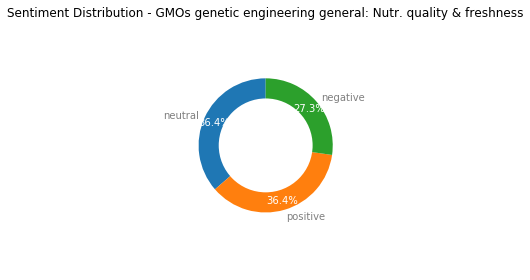

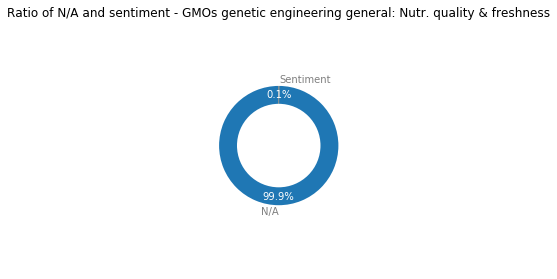

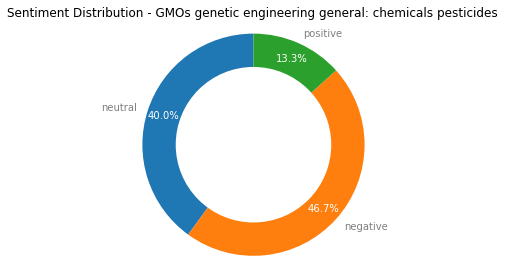

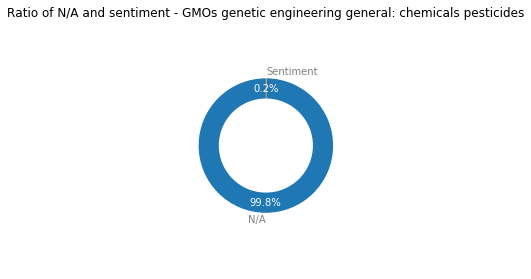

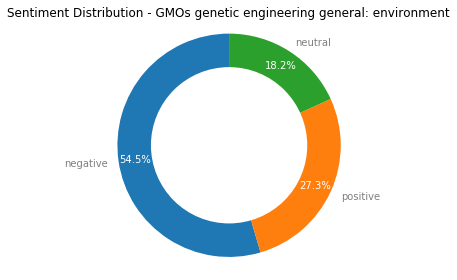

...

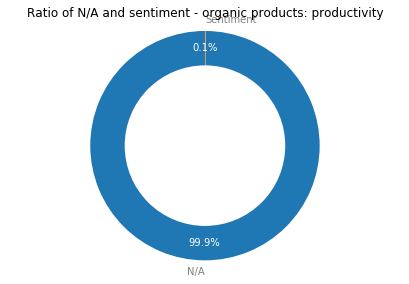

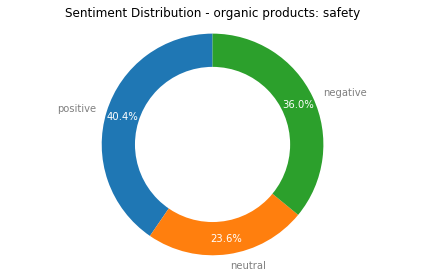

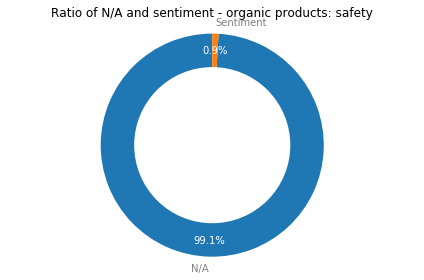

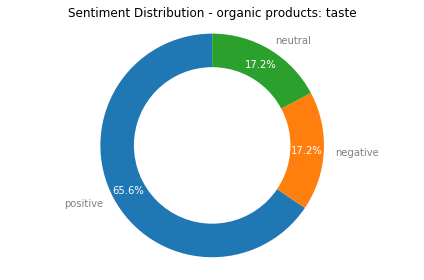

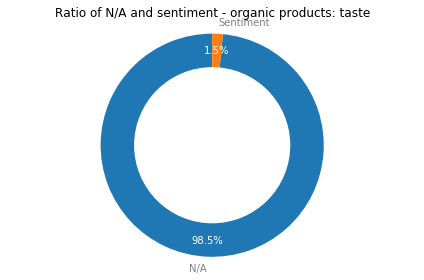

<Figure size 432x288 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

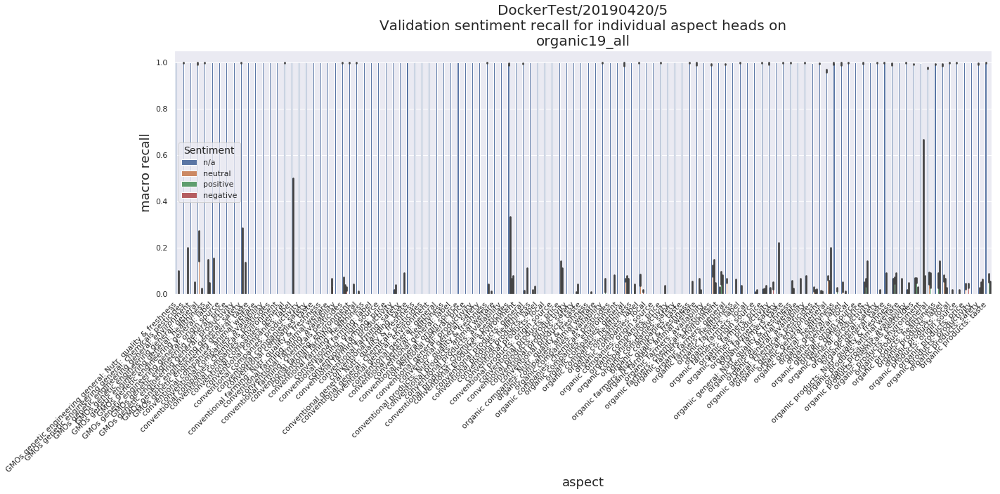

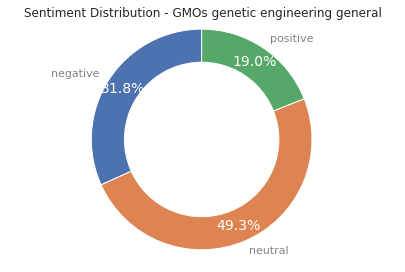

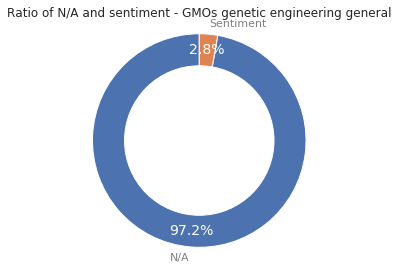

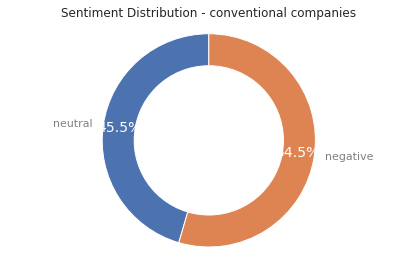

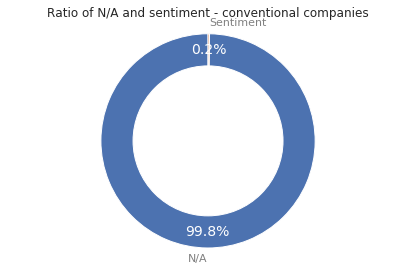

...

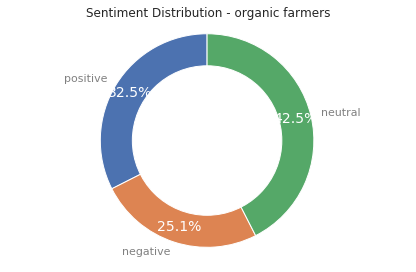

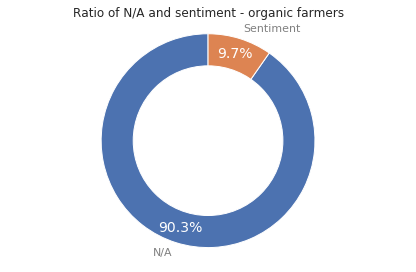

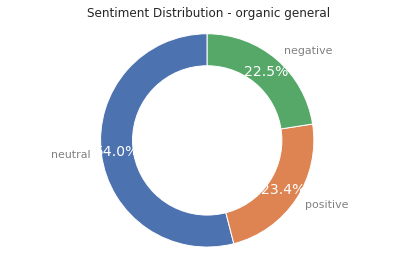

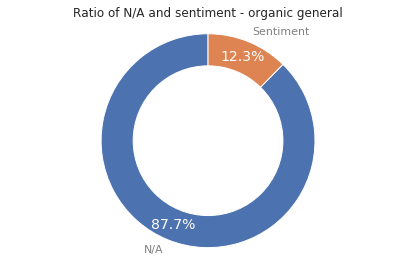

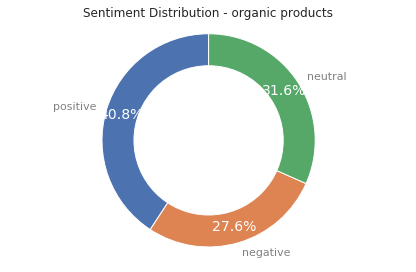

<Figure size 432x288 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

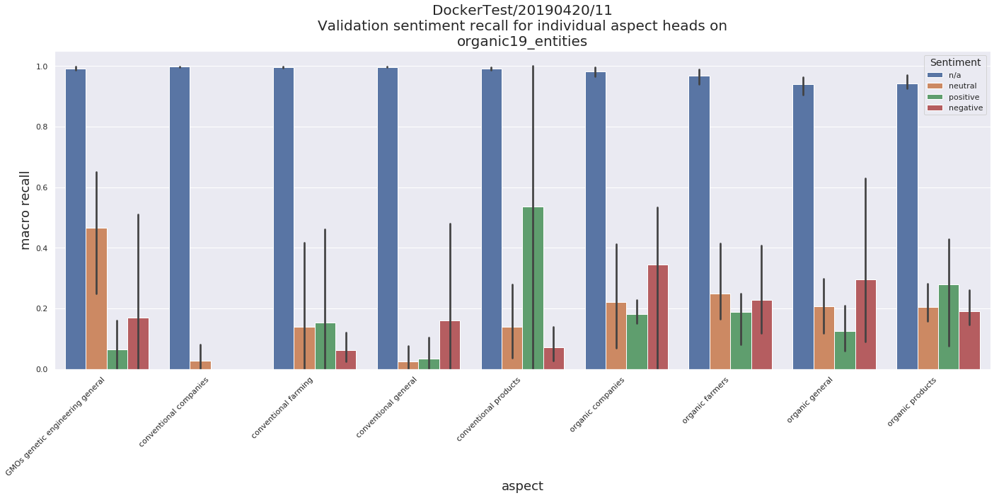

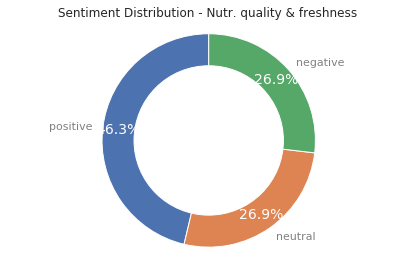

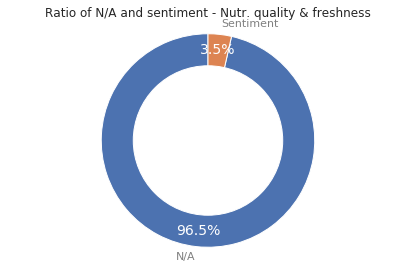

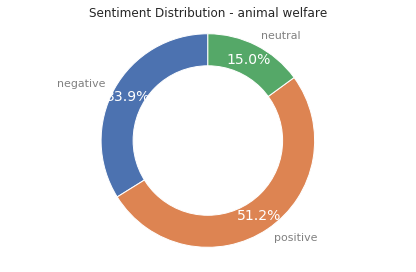

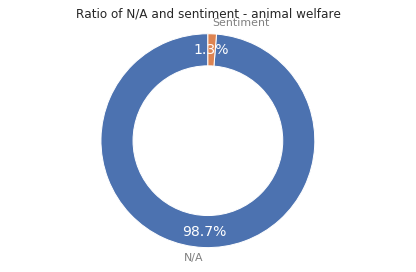

...

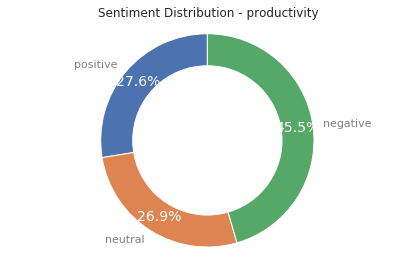

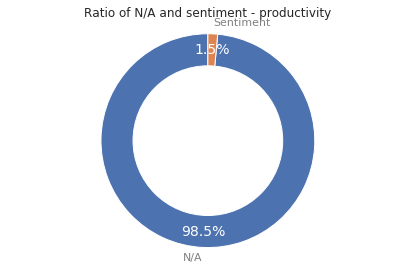

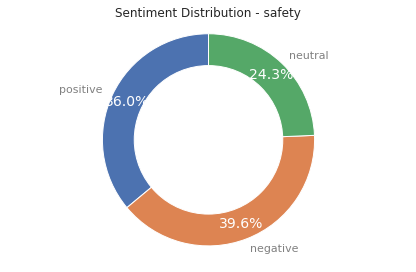

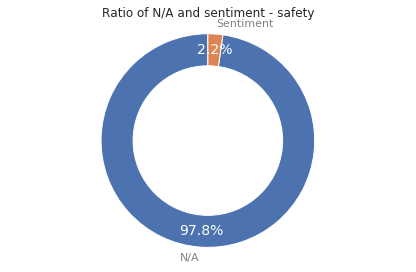

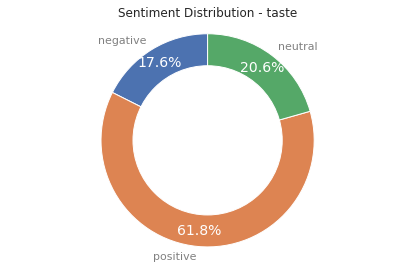

<Figure size 432x288 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

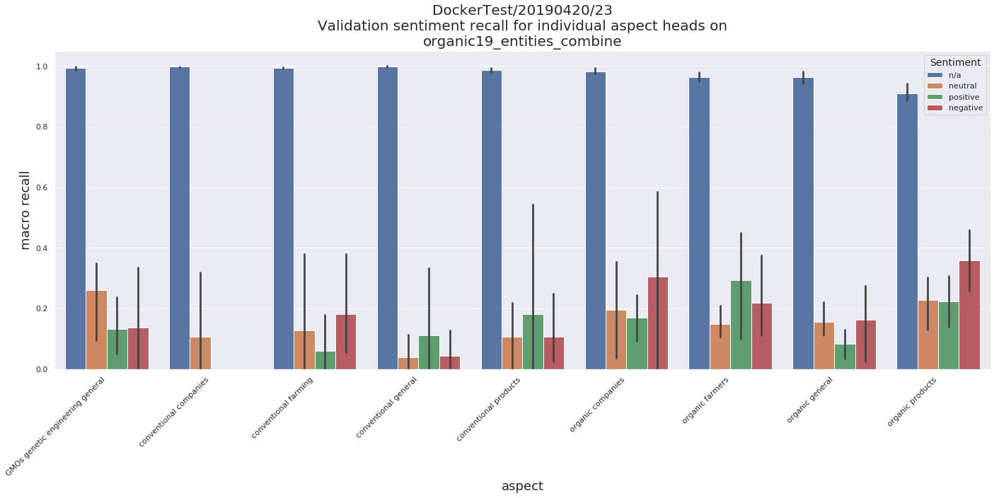

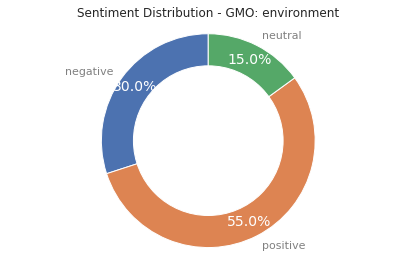

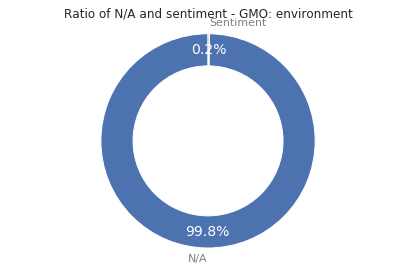

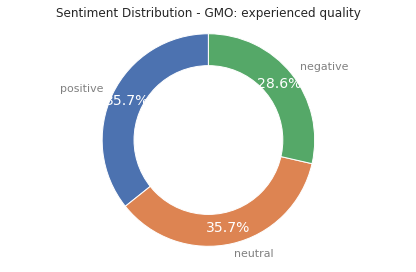

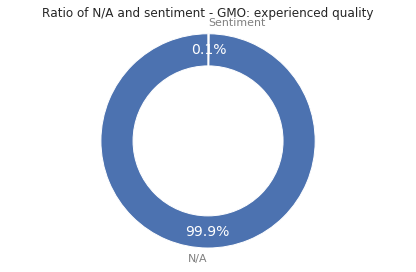

...

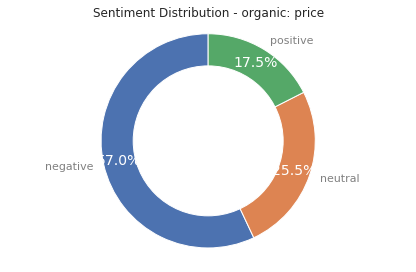

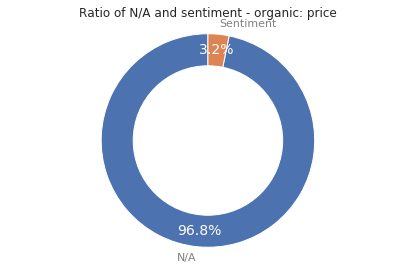

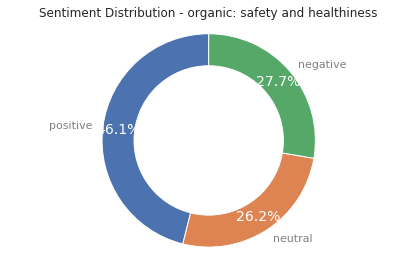

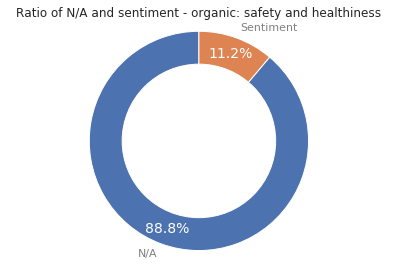

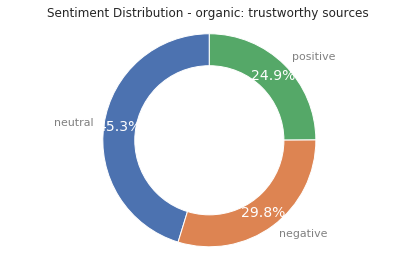

<Figure size 432x288 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 720x432 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

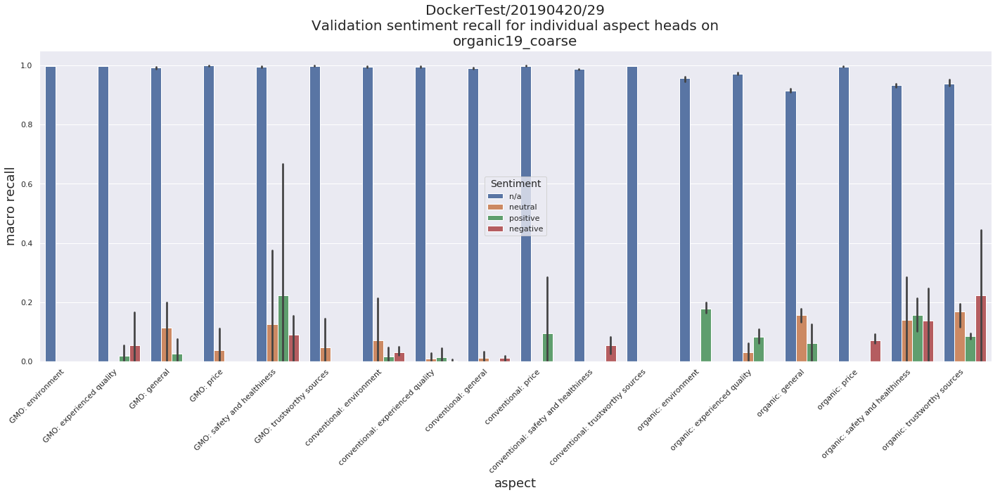

In [6]:
for e in experiments:
    name = e['name']
    print(f'#########################################################################\n\nExperiment Name: {name}\n')
    print('#########################################################################\n\n')
    test_params = {**baseline, **{'num_epochs': 35, 'language': 'en'}}
    test_params = {**test_params, **e['rc']}
    e = Experiment('DockerTest', e['description'], default_params, test_params, dsl, runs=5)
    e.run()



# Experiments for the second evaluation round

In [ ]:
main_experiment_name = 'Organic2019_Experiment_Round2'
experiments = [
    {
        'name': 'LMS-H',
        'description': 'Uses the coarse aspects ',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_COARSE,
            'output_layer_type': OutputLayerType.LinearSum
        }
    },
    {
        'name': 'CNN-H',
        'description': 'Uses the classification of coarse aspects',
        'loss': 1000,
        'f1': -1,
        'rc': {
            'task': ORGANIC_TASK_COARSE,
            'output_layer_type': OutputLayerType.LinearSum
        }
    }
]

In [ ]:
utils.get_current_git_commit()
print('Current commit: ' + utils.get_current_git_commit())

In [ ]:
for e in experiments:
    name = e['name']
    print(f'#########################################################################\n\nExperiment Name: {name}\n')
    print('#########################################################################\n\n')
    test_params = {**baseline, **{'num_epochs': 35, 'language': 'en'}}
    test_params = {**test_params, **e['rc']}
    e = Experiment(main_experiment_name, e['description'], default_params, test_params, dsl, runs=3)
    e.run()


